In [2]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

import numpy as np
import matplotlib.colors as mcolors

import matplotlib.cm as cm
import seaborn as sns

### funciones 

In [3]:
def boxplot_general(metrica):
    plt.figure(figsize=(4, 4))
    sns.boxplot(y=df_metricas_overall[metrica], color='skyblue', showmeans=True, meanprops={"marker":"o",
                        "markerfacecolor":"red", "markeredgecolor":"black", "markersize":5})
    sns.stripplot(y=df_metricas_overall[metrica], color='black', alpha=0.5, jitter=True)


    plt.title(f'Distribución de {metrica}.')
    plt.ylabel(f'{metrica}')
    plt.show()

    
def boxplot_source(metrica):
    plt.figure(figsize=(10, 4))

    # Boxplot con filtro CHIRPS
    plt.subplot(1, 2, 1)
    sns.boxplot(y=df_metricas_overall[df_metricas_overall['source'] == 'chirps'][metrica], color='lightgreen', showmeans=True, meanprops={"marker":"o",
                        "markerfacecolor":"red", "markeredgecolor":"black", "markersize":8})
    sns.stripplot(y=df_metricas_overall[df_metricas_overall['source'] == 'chirps'][metrica], color='black', alpha=0.5, jitter=True)
    plt.title(f'Distribución de {metrica} (CHIRPS)')
    plt.ylabel("")

    # Boxplot con filtro AGERA
    plt.subplot(1, 2, 2)
    sns.boxplot(y=df_metricas_overall[df_metricas_overall['source'] == 'agera5'][metrica], color='salmon', showmeans=True, meanprops={"marker":"o",
                        "markerfacecolor":"red", "markeredgecolor":"black", "markersize":8})
    sns.stripplot(y=df_metricas_overall[df_metricas_overall['source'] == 'agera5'][metrica], color='black', alpha=0.5, jitter=True)
    plt.title(f'Distribución de {metrica} (AGERA)')
    plt.ylabel("")


    plt.tight_layout()
    plt.show()

In [4]:
df_metricas= pd.read_parquet('data/monthly_metrics.parquet')
georefe= pd.read_parquet('data/prec_monthly_obs_sat.parquet')[['latitud','longitud','station']].drop_duplicates(keep='first').reset_index(drop=True)

In [5]:
df_metricas_monthly=georefe.merge(df_metricas, on='station', how='inner')
df_metricas_monthly.head(3)

,latitud,longitud,station,clasificacion,departamento,municipio,mes,r2,r2_ajustado,rmse,mae,std_error,kge,spearman,bias,mape,maape,source
0,2.69814,-75.29815,FEDEARROZ_CAMPOALEGRE_ALTAGRACIA,A,HUILA,CAMPOALEGRE,1,-0.432291,-0.611327,104.202734,85.149,97.009215,0.082316,-0.066667,-38.045000,50.349702,0.446402,agera5
1,2.69814,-75.29815,FEDEARROZ_CAMPOALEGRE_ALTAGRACIA,A,HUILA,CAMPOALEGRE,2,-0.219753,-0.372223,67.194785,59.931,61.914935,0.222341,0.163636,-26.109000,69.225511,0.504275,agera5
2,2.69814,-75.29815,FEDEARROZ_CAMPOALEGRE_ALTAGRACIA,A,HUILA,CAMPOALEGRE,3,0.024200,-0.084222,113.514574,96.960,113.409082,0.267899,0.527273,4.892728,76.020062,0.540922,agera5


In [6]:
df_metricas_monthly.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1104 entries, 0 to 1103
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   latitud        1104 non-null   float64
 1   longitud       1104 non-null   float64
 2   station        1104 non-null   object 
 3   clasificacion  1104 non-null   object 
 4   departamento   1104 non-null   object 
 5   municipio      1104 non-null   object 
 6   mes            1104 non-null   int64  
 7   r2             1092 non-null   float64
 8   r2_ajustado    1054 non-null   float64
 9   rmse           1092 non-null   float64
 10  mae            1092 non-null   float64
 11  std_error      1092 non-null   float64
 12  kge            1091 non-null   float64
 13  spearman       1091 non-null   float64
 14  bias           1092 non-null   float64
 15  mape           1092 non-null   float64
 16  maape          1092 non-null   float64
 17  source         1104 non-null   object 
dtypes: float

# METRICAS STANDAR

In [7]:
cd

/home/jupyter


In [8]:
# Cargar el shapefile de Colombia y departamentos
shapefile_path = 'csicap_fedearroz_evaluacion/maps/ne_110m_admin_0_countries.shp'
world = gpd.read_file(shapefile_path)
colombia = world[world['SOV_A3'] == 'COL']

# departamentos de Colombia
departments_shapefile = 'csicap_fedearroz_evaluacion/maps/MGN_ADM_DPTO_POLITICO.shp'
departments = gpd.read_file(departments_shapefile)


In [10]:
world.head()

,featurecla,scalerank,LABELRANK,SOVEREIGNT,SOV_A3,ADM0_DIF,LEVEL,TYPE,TLC,ADMIN,...,FCLASS_TR,FCLASS_ID,FCLASS_PL,FCLASS_GR,FCLASS_IT,FCLASS_NL,FCLASS_SE,FCLASS_BD,FCLASS_UA,geometry
0,Admin-0 country,1,6,Fiji,FJI,0,2,Sovereign country,1,Fiji,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ..."
1,Admin-0 country,1,3,United Republic of Tanzania,TZA,0,2,Sovereign country,1,United Republic of Tanzania,...,None,None,None,None,None,None,None,None,None,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3..."
2,Admin-0 country,1,7,Western Sahara,SAH,0,2,Indeterminate,1,Western Sahara,...,Unrecognized,Unrecognized,Unrecognized,None,None,Unrecognized,None,None,None,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,Admin-0 country,1,2,Canada,CAN,0,2,Sovereign country,1,Canada,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((-122.84 49, -122.97421 49.0025..."
4,Admin-0 country,1,2,United States of America,US1,1,2,Country,1,United States of America,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((-122.84 49, -120 49, -117.0312..."


## MAPE_por clasificacion... muy extenso graficamente

In [7]:
# Definir los límites para MAPE
limites_mape = {
    "Excelente": (0, 20),
    "Bueno": (20, 35),
    "Regular": (35, 50),
    "Malo": (50, float("inf"))
}

## MAPE por meses

chirps
agera5
chirps
agera5
chirps
agera5
chirps
agera5
chirps
agera5
chirps
agera5
chirps
agera5
chirps
agera5
chirps
agera5
chirps
agera5
chirps
agera5
chirps
agera5


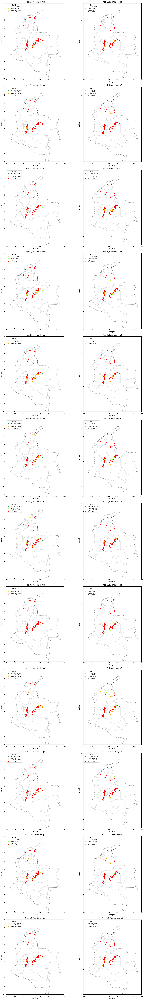

In [8]:

limites_mape = {
    "Excelente": (0, 20),
    "Bueno": (20, 35),
    "Regular": (35, 50),
    "Malo": (50, float("inf"))
}

def plot_mape(df, source, month, ax):
    df_filtered = df[(df['source'] == source) & (df['mes'] == month)]
    
    colombia.plot(ax=ax, edgecolor='gray', facecolor='white')
    departments.plot(ax=ax, edgecolor='lightgray', facecolor='none', linewidth=0.5)

    print(source)
    def get_color(mape):
        if limites_mape["Excelente"][0] <= mape < limites_mape["Excelente"][1]:
            return '#2E8B57'  # Verde oscuro
        elif limites_mape["Bueno"][0] <= mape < limites_mape["Bueno"][1]:
            return '#ADFF2F'  # Amarillo verdoso
        elif limites_mape["Regular"][0] <= mape < limites_mape["Regular"][1]:
            return 'orange'
        else:
            return 'red'

    
    for _, row in df_filtered.iterrows():
        ax.plot(row['longitud'], row['latitud'], marker='o', markersize=7, color=get_color(row['mape']), label=row['station'])

    
    ax.set_xlim([-80, -66])
    ax.set_ylim([-4, 14])
    ax.set_aspect('equal')
    
    
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', label='Excelente (0-20%)', markerfacecolor='#2E8B57', markersize=5),
        plt.Line2D([0], [0], marker='o', color='w', label='Bueno (20-35%)', markerfacecolor='#ADFF2F', markersize=5),
        plt.Line2D([0], [0], marker='o', color='w', label='Regular (35-50%)', markerfacecolor='orange', markersize=5),
        plt.Line2D([0], [0], marker='o', color='w', label='Malo (>50%)', markerfacecolor='red', markersize=5)
    ]
    
    ax.legend(handles=legend_elements, title="MAPE", loc='upper left', fontsize=8)
    ax.set_title(f'Mes: {month}, Fuente: {source}', fontsize=12)
    ax.set_xlabel('Longitud', fontsize=10)
    ax.set_ylabel('Latitud', fontsize=10)


meses = df_metricas_monthly['mes'].unique()


fig, axes = plt.subplots(len(meses), 2, figsize=(16, 8 * len(meses)))

for i, month in enumerate(meses):
    plot_mape(df_metricas_monthly, 'chirps', month, ax=axes[i, 0])
    plot_mape(df_metricas_monthly, 'agera5', month, ax=axes[i, 1])

plt.tight_layout()
plt.show()


## KGE

In [16]:
df_metricas_overall =pd.read_excel('csicap_fedearroz_evaluacion/data/overall_metrics.xlsx')

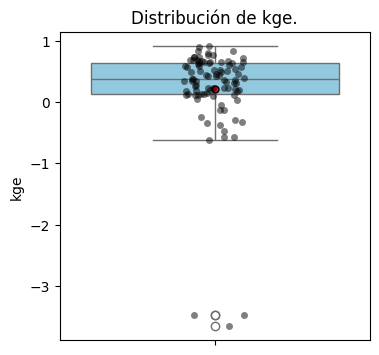

In [14]:
boxplot_general('kge')

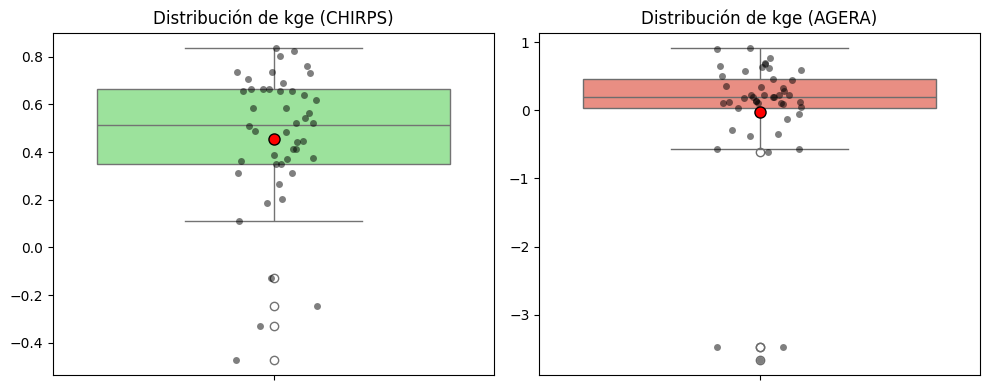

In [15]:
boxplot_source('kge')

In [17]:
limites_kge = {
    "Excelente": (0.8, 1.0),
    "Bueno": (0.6, 0.8),
    "Regular": (0.3, 0.6),
    "Deficiente": (-float("inf"),0.3)
}

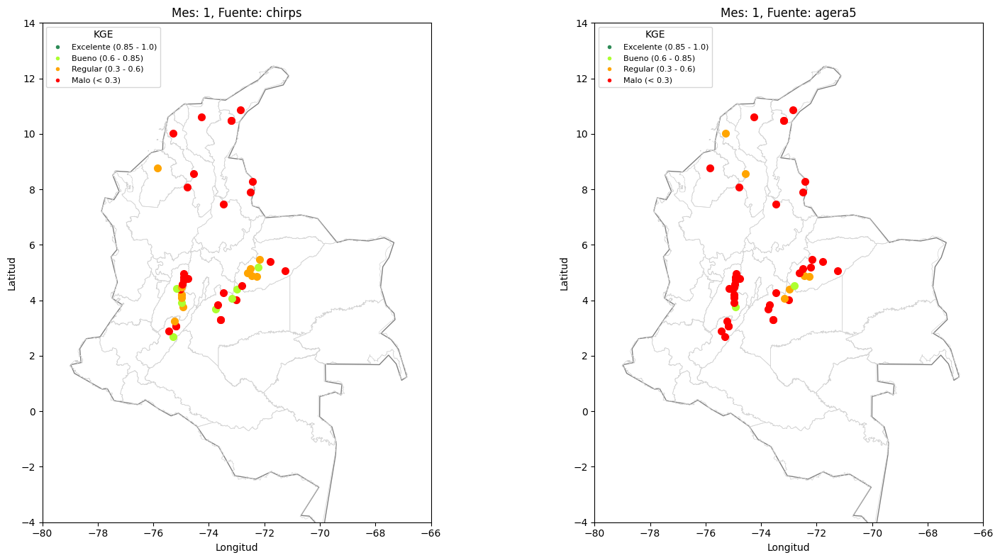

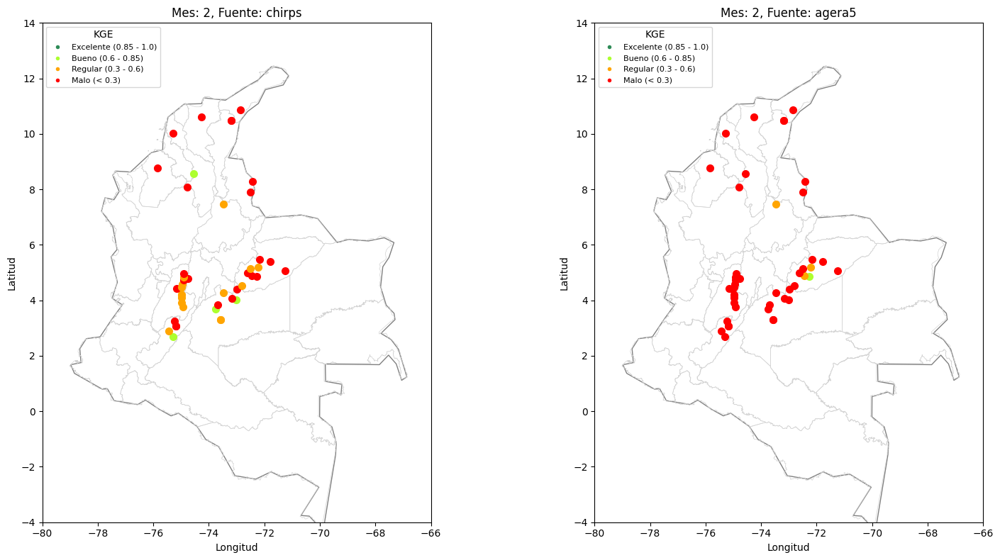

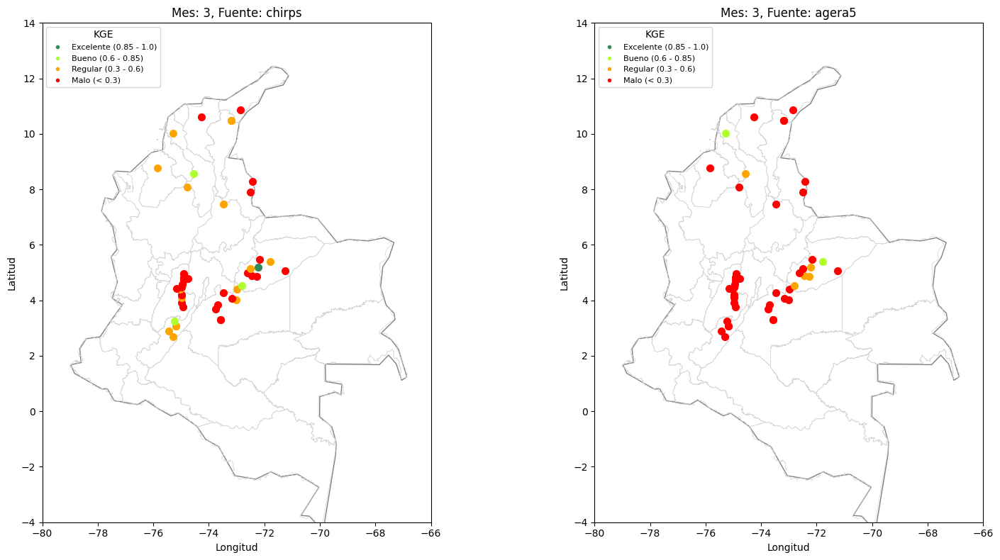

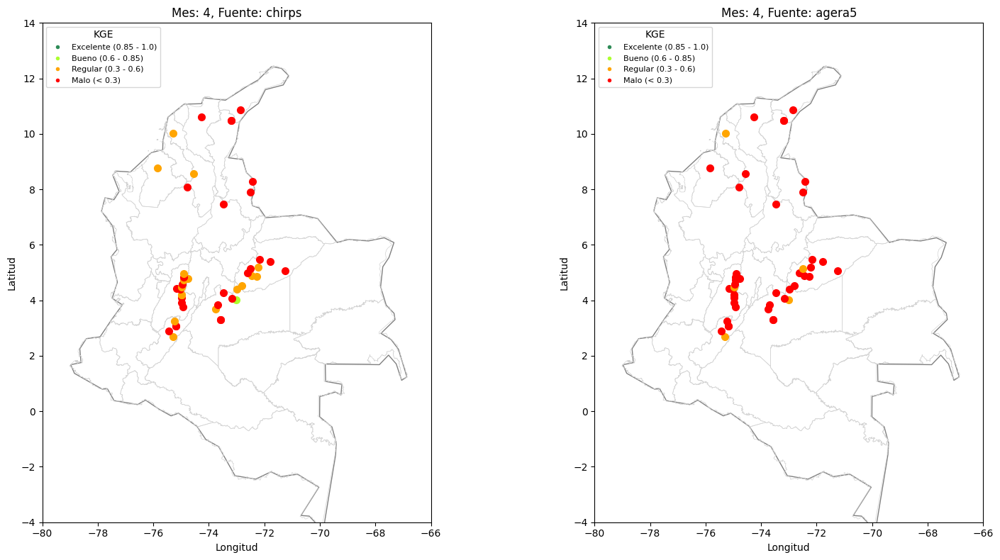

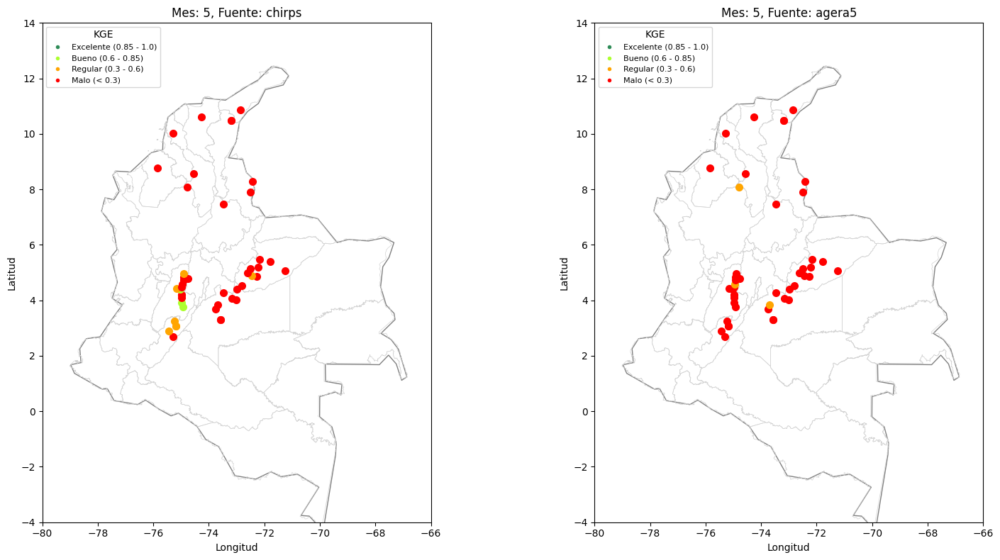

...

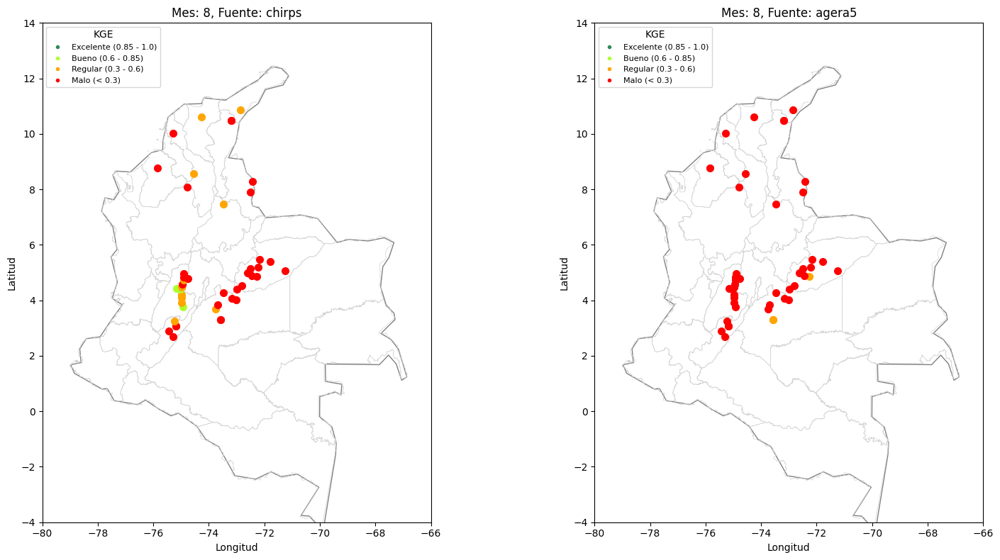

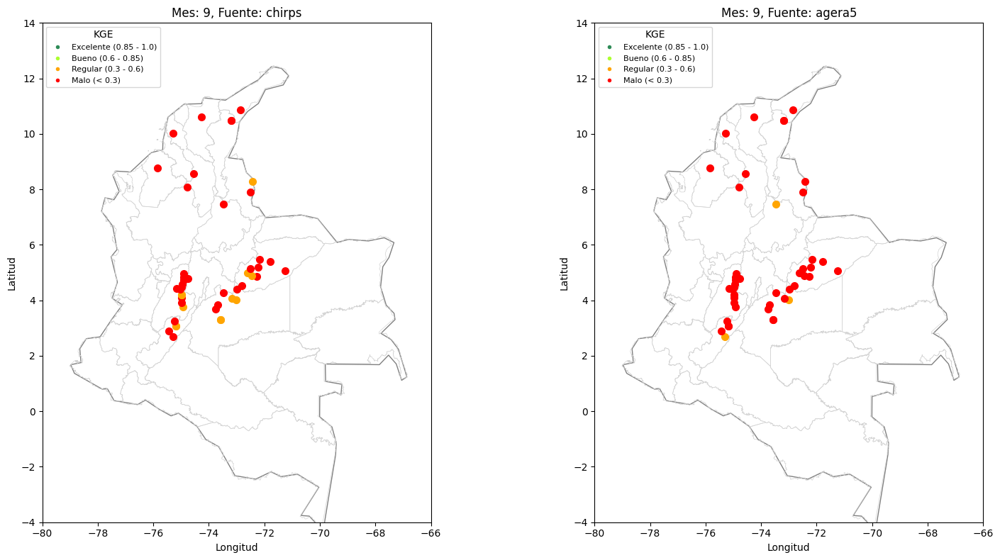

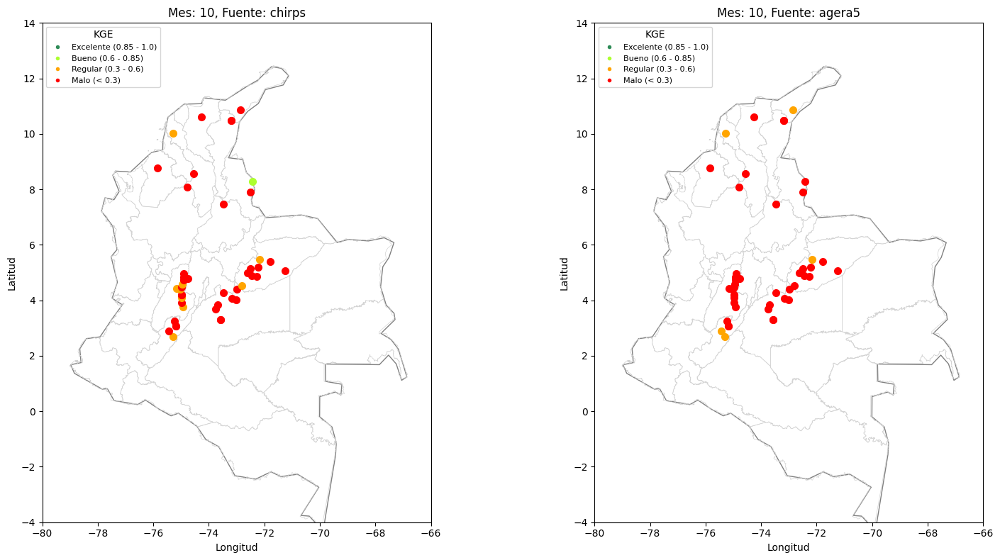

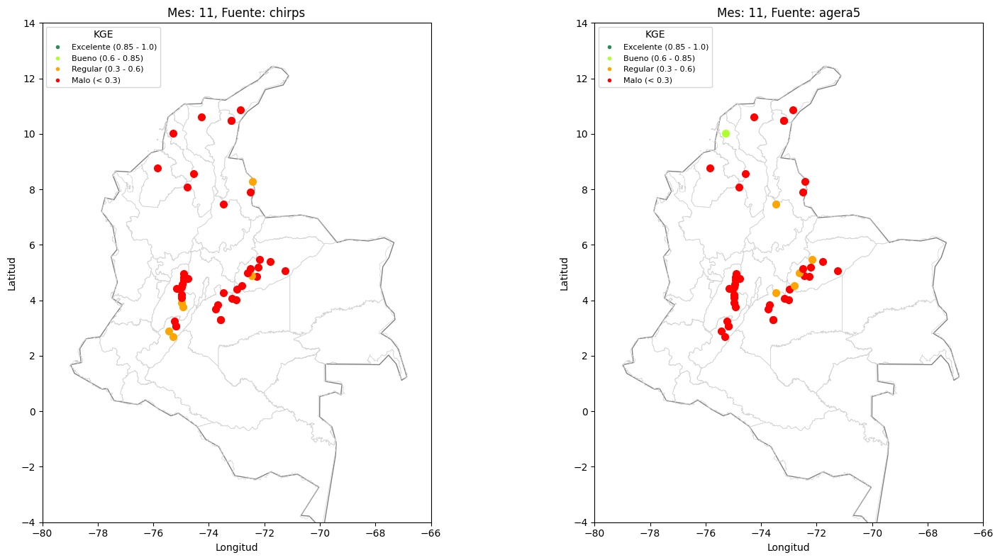

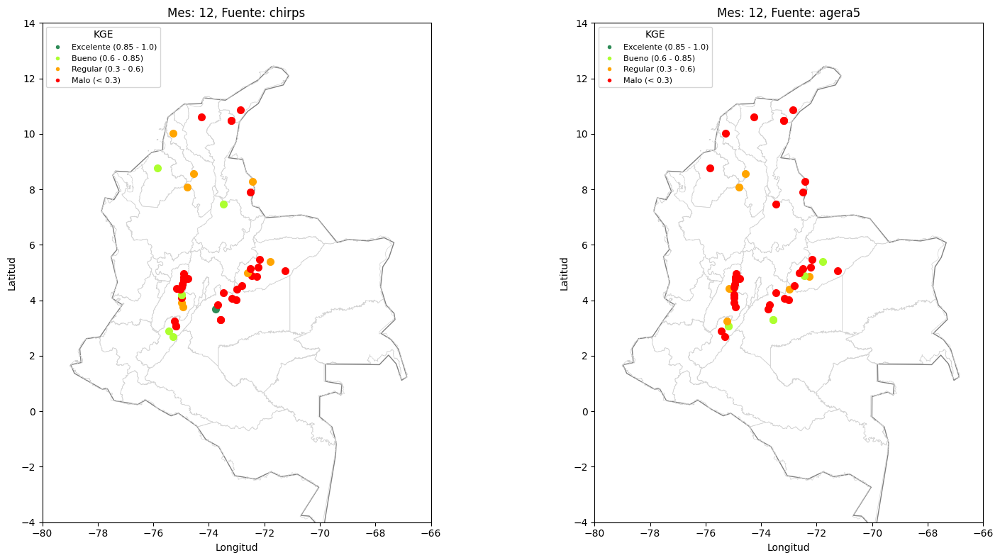

In [18]:


def plot_kge(df, source, month, ax):
    # Filtrar el DataFrame por source y mes
    df_filtered = df[(df['source'] == source) & (df['mes'] == month)]
    
    # Dibujar el mapas
    colombia.plot(ax=ax, edgecolor='gray', facecolor='white')
    departments.plot(ax=ax, edgecolor='lightgray', facecolor='none', linewidth=0.5)

    # Definir los colores según el valor de KGE
    def get_color(kge):
        if limites_kge["Excelente"][0] <= kge <= limites_kge["Excelente"][1]:
            return '#2E8B57'  # Verde oscuro
        elif limites_kge["Bueno"][0] <= kge < limites_kge["Bueno"][1]:
            return '#ADFF2F'  # Amarillo verdoso
        elif limites_kge["Regular"][0] <= kge < limites_kge["Regular"][1]:
            return 'orange'
        else:
            return 'red'

    # Pintar los puntos de las estaciones con el color correspondiente
    for _, row in df_filtered.iterrows():
        ax.plot(row['longitud'], row['latitud'], marker='o', markersize=7, color=get_color(row['kge']), label=row['station'])

    # Ajustar límites y aspecto del mapa
    ax.set_xlim([-80, -66])
    ax.set_ylim([-4, 14])
    ax.set_aspect('equal')
    
    # Leyenda de KGE
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', label='Excelente (0.85 - 1.0)', markerfacecolor='#2E8B57', markersize=5),
        plt.Line2D([0], [0], marker='o', color='w', label='Bueno (0.6 - 0.85)', markerfacecolor='#ADFF2F', markersize=5),
        plt.Line2D([0], [0], marker='o', color='w', label='Regular (0.3 - 0.6)', markerfacecolor='orange', markersize=5),
        plt.Line2D([0], [0], marker='o', color='w', label='Malo (< 0.3)', markerfacecolor='red', markersize=5)
    ]
    
    ax.legend(handles=legend_elements, title="KGE", loc='upper left', fontsize=8)
    ax.set_title(f'Mes: {month}, Fuente: {source}', fontsize=12)
    ax.set_xlabel('Longitud', fontsize=10)
    ax.set_ylabel('Latitud', fontsize=10)

# Obtener lista de meses únicos
meses = df_metricas_monthly['mes'].unique()

#organizacion de la info
for month in meses:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
    
    # Generar el mapa para CHIRPS
    plot_kge(df_metricas_monthly, 'chirps', month, ax=ax1)
    
    # Generar el mapa para AGERA
    plot_kge(df_metricas_monthly, 'agera5', month, ax=ax2)
    
    # Ajustar el espacio entre los subplots
    plt.tight_layout()
    plt.draw()  # Dibujar el gráfico
    plt.pause(0.001)  # Pausar brevemente para mostrarlo
plt.show()  # Mostrar el último gráfico al finalizar


## SPEARMAN

In [19]:
df_metricas_overall.spearman.max()

1.0

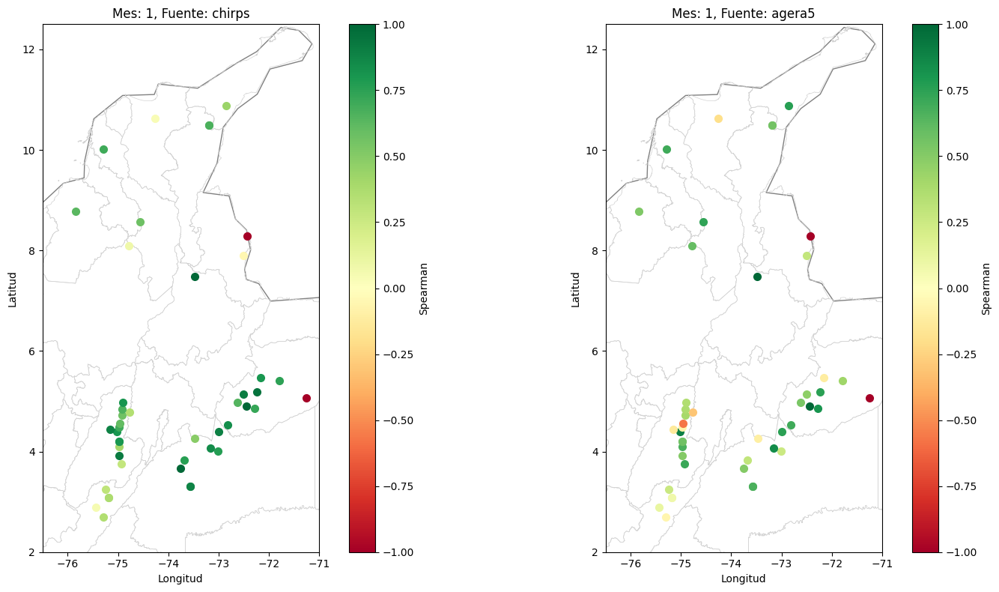

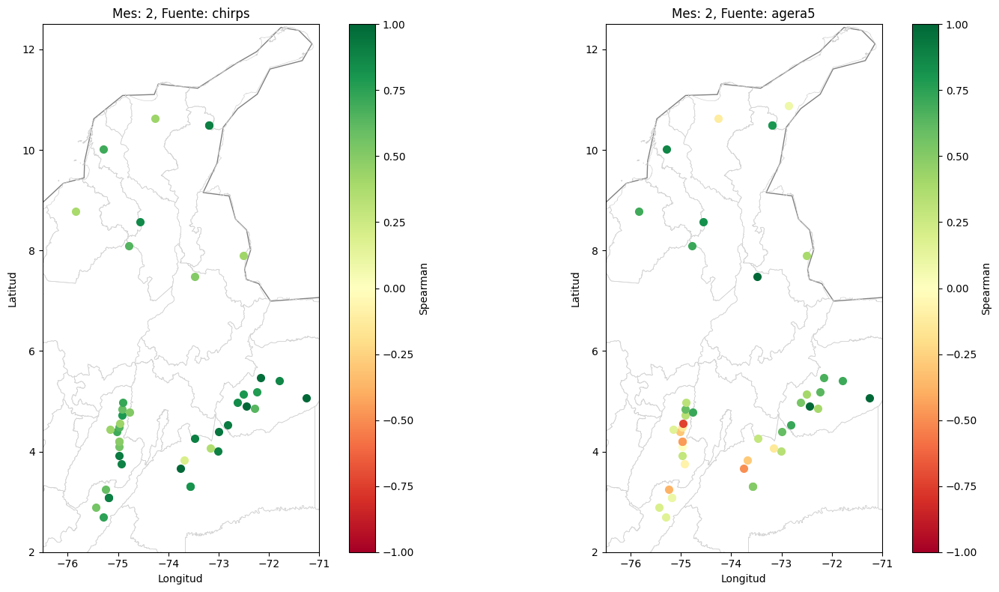

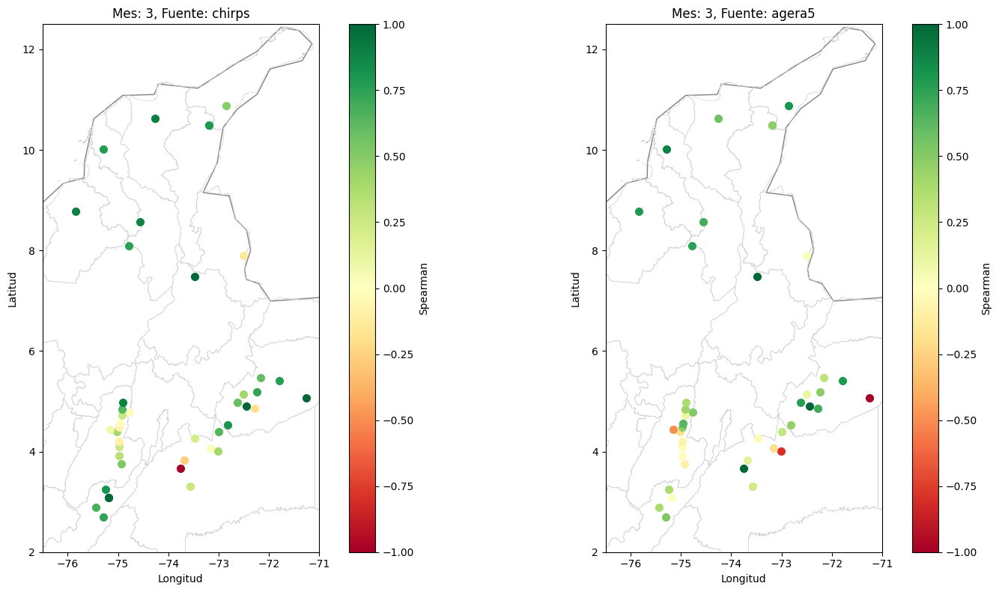

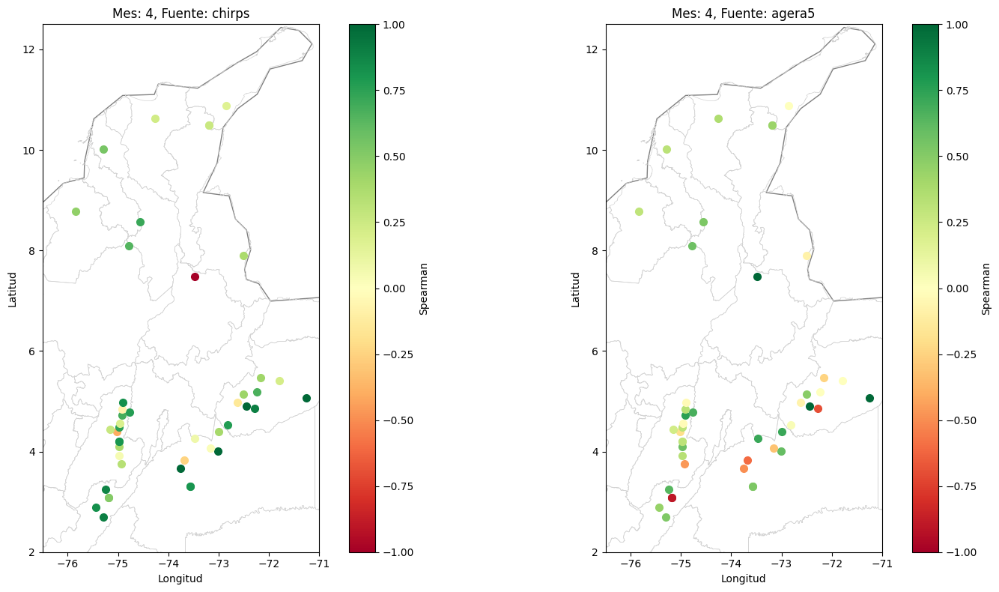

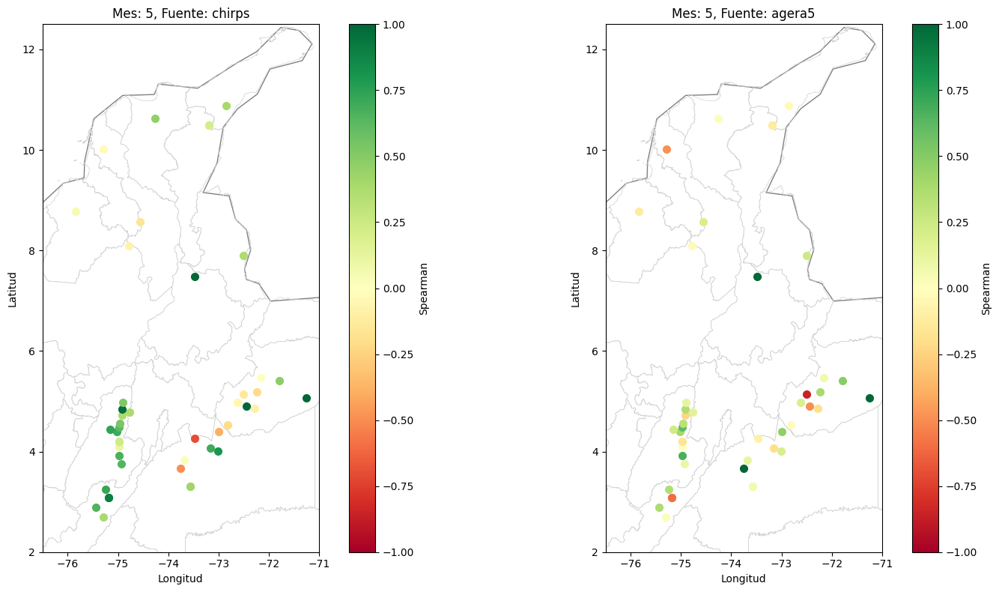

...

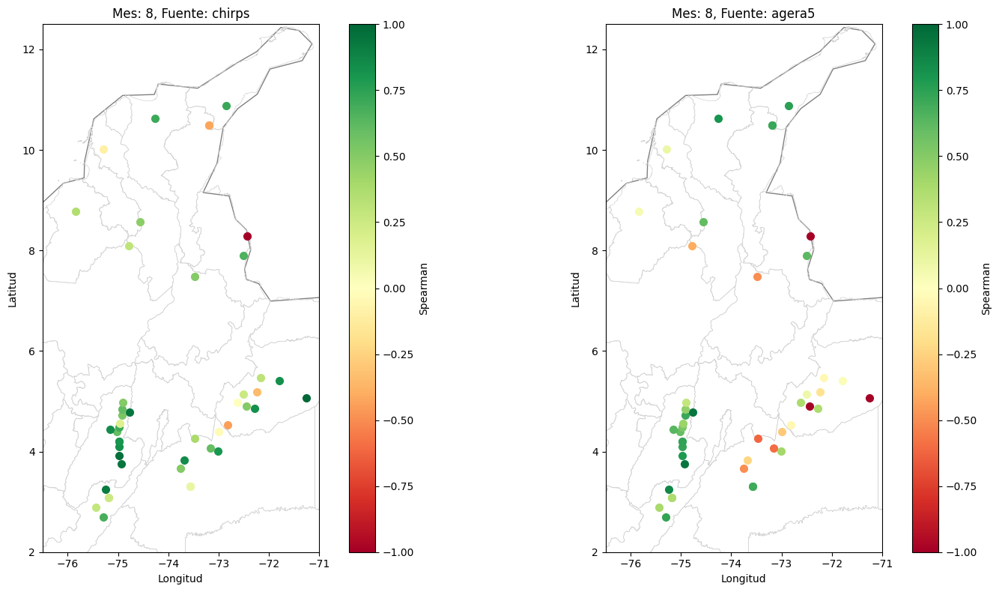

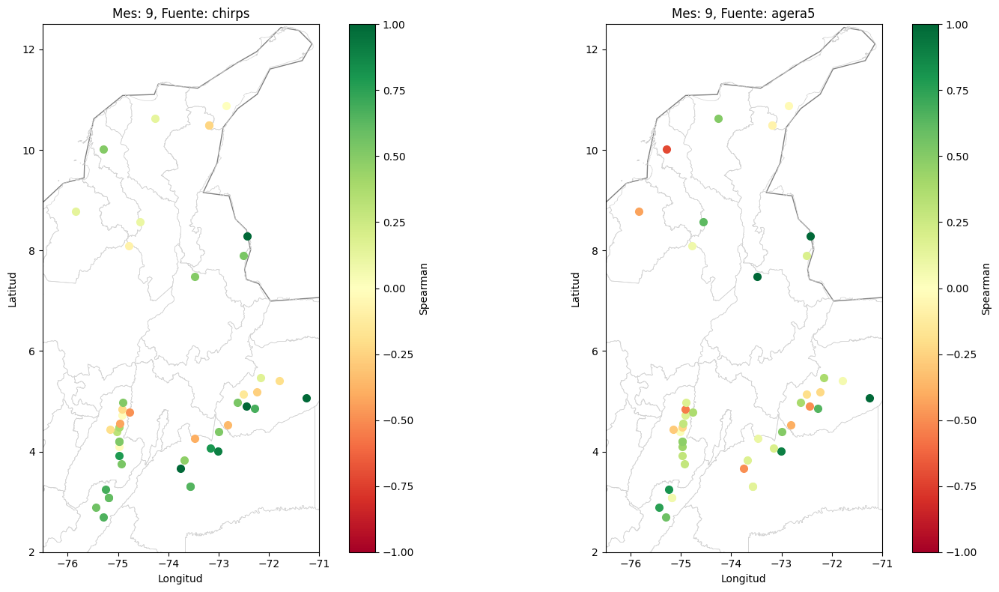

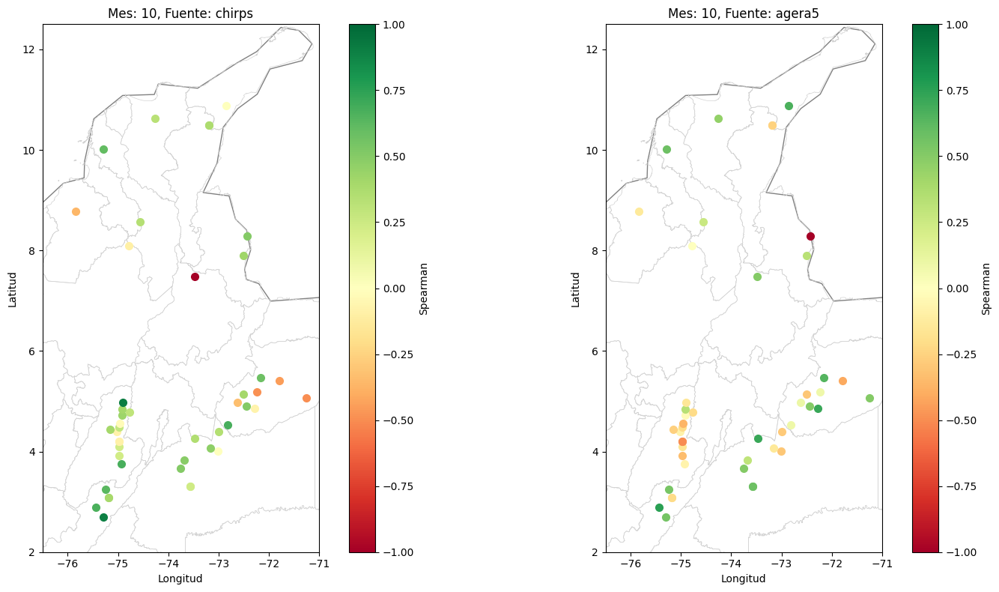

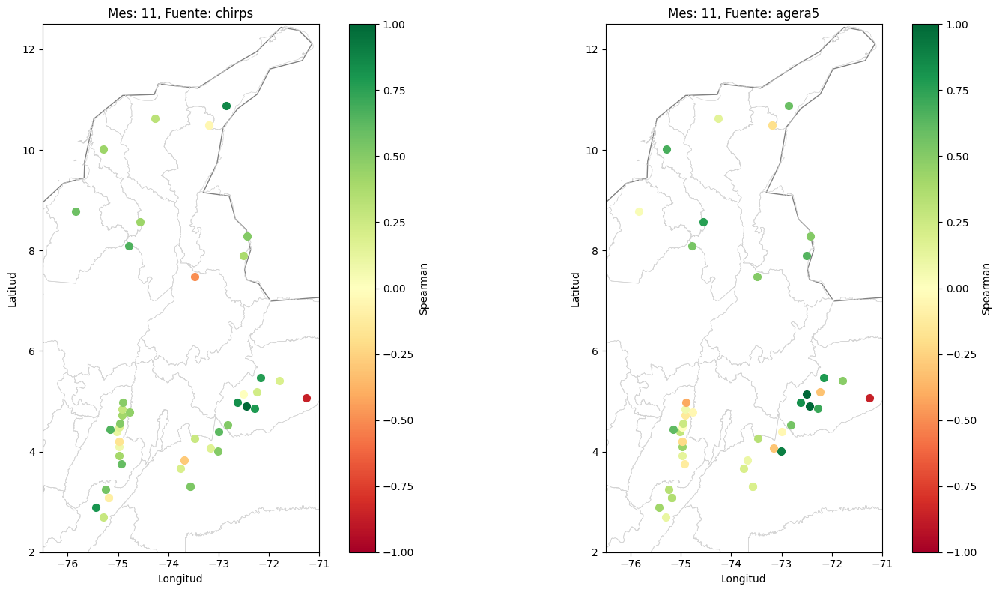

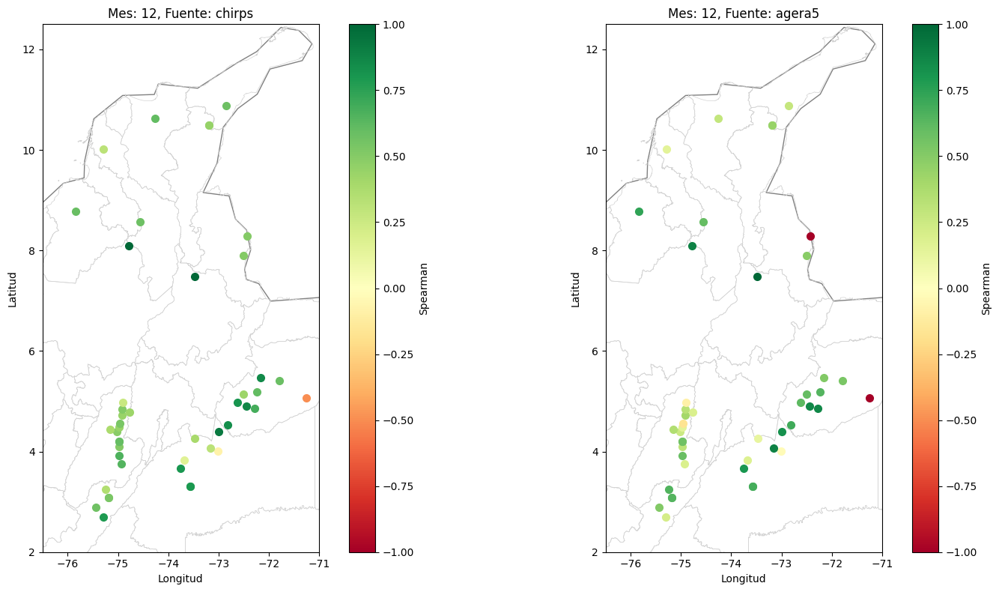

In [12]:


def plot_spearman(df, source, month, ax):
    # Filtrar el DataFrame por source y mes
    df_filtered = df[(df['source'] == source) & (df['mes'] == month)]
    
    # Dibujar el mapa de Colombia
    colombia.plot(ax=ax, edgecolor='gray', facecolor='white')
    departments.plot(ax=ax, edgecolor='lightgray', facecolor='none', linewidth=0.5)

    # Definir el colormap de rojo a verde y el rango de normalización basado en los datos de Spearman
    cmap = cm.RdYlGn  # Colormap de rojo a verde
    norm = mcolors.Normalize(vmin=df['spearman'].min(), vmax=df['spearman'].max())  # Normalización según el rango realde la metrica
    
    # Pintar los puntos de las estaciones según el valor de Spearman
    for _, row in df_filtered.iterrows():
        spearman_value = row['spearman']
        color = cmap(norm(spearman_value))
        ax.plot(row['longitud'], row['latitud'], marker='o', markersize=7, color=color, label=row['station'])

    # Ajustar límites y aspecto del mapa para hacer una especie de zoom
    ax.set_xlim([-76.5, -71])#long
    ax.set_ylim([2, 12.5])
    ax.set_aspect('equal')

    # Barra de color para Spearman
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, orientation='vertical', label='Spearman')

    # Título y etiquetas
    ax.set_title(f'Mes: {month}, Fuente: {source}', fontsize=12)
    ax.set_xlabel('Longitud', fontsize=10)
    ax.set_ylabel('Latitud', fontsize=10)


meses = df_metricas_monthly['mes'].unique()


for month in meses:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
    

    plot_spearman(df_metricas_monthly, 'chirps', month, ax=ax1)
    plot_spearman(df_metricas_monthly, 'agera5', month, ax=ax2)
    

    plt.tight_layout()
    plt.draw()  

plt.show()  


# Métricas no estandarizadas

## RMSE

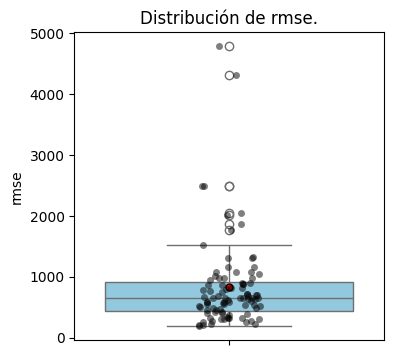

In [21]:
boxplot_general('rmse')

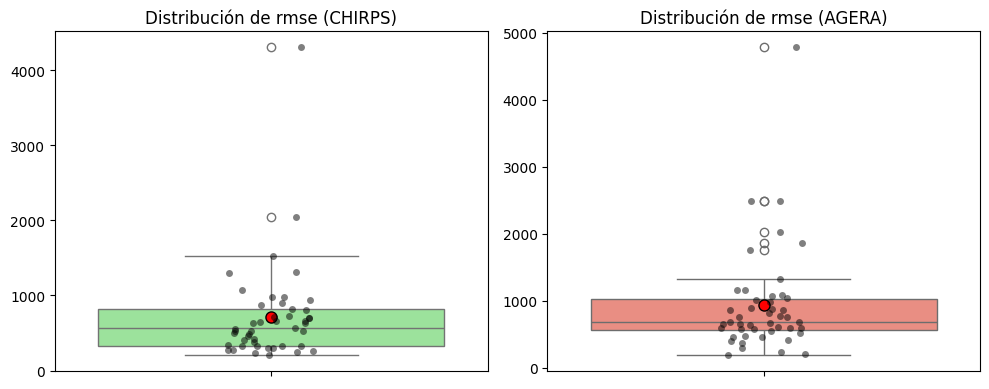

In [22]:
boxplot_source('rmse')

In [23]:

# Calcular las estadísticas
q1 = df_metricas_monthly[df_metricas_monthly['source'] == 'chirps']['rmse'].quantile(0.25)
q2 = df_metricas_monthly[df_metricas_monthly['source'] == 'chirps']['rmse'].quantile(0.5)  # Mediana
q3 = df_metricas_monthly[df_metricas_monthly['source'] == 'chirps']['rmse'].quantile(0.75)
mean = df_metricas_monthly[df_metricas_monthly['source'] == 'chirps']['rmse'].mean()

# Crear un diccionario con los resultados
summary_chirps = {
    "Q1": q1,
    "Q2 (Mediana)": q2,
    "Q3": q3,
    "Promedio": mean
}

# Mostrar los resultados
summary_chirps

{'Q1': 47.03774389078174,
 'Q2 (Mediana)': 79.407700359949,
 'Q3': 138.4303925270233,
 'Promedio': 115.8954480274921}

In [15]:

# Calcular las estadísticas
q1 = df_metricas_monthly[df_metricas_monthly['source'] == 'agera5']['rmse'].quantile(0.25)
q2 = df_metricas_monthly[df_metricas_monthly['source'] == 'agera5']['rmse'].quantile(0.5)  # Mediana
q3 = df_metricas_monthly[df_metricas_monthly['source'] == 'agera5']['rmse'].quantile(0.75)
mean = df_metricas_monthly[df_metricas_monthly['source'] == 'agera5']['rmse'].mean()

# Crear un diccionario con los resultados
summary_agera = {
    "Q1": q1,
    "Q2 (Mediana)": q2,
    "Q3": q3,
    "Promedio": mean
}

# Mostrar los resultados
summary_agera

{'Q1': 64.08986740003324,
 'Q2 (Mediana)': 105.94441708066135,
 'Q3': 161.2226100742181,
 'Promedio': 141.97769925446036}

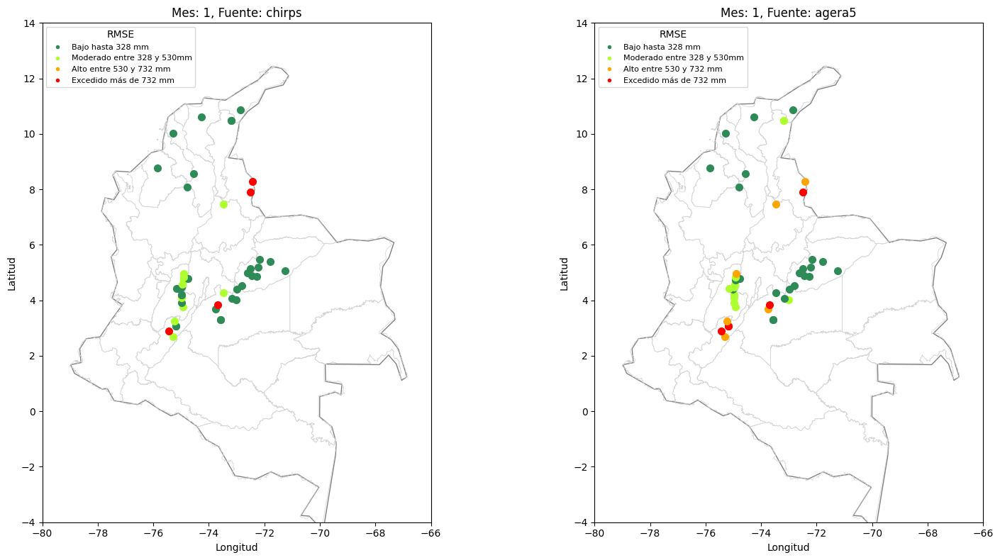

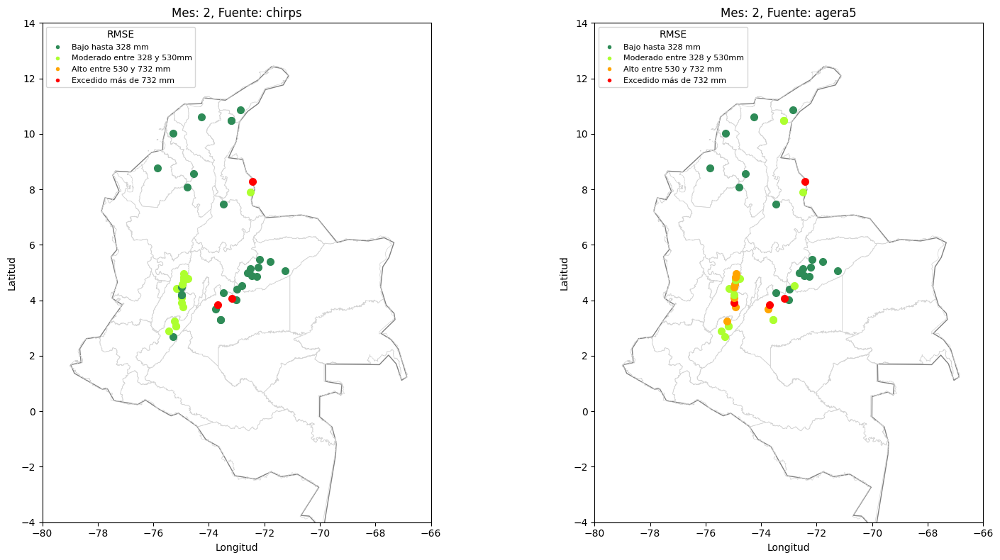

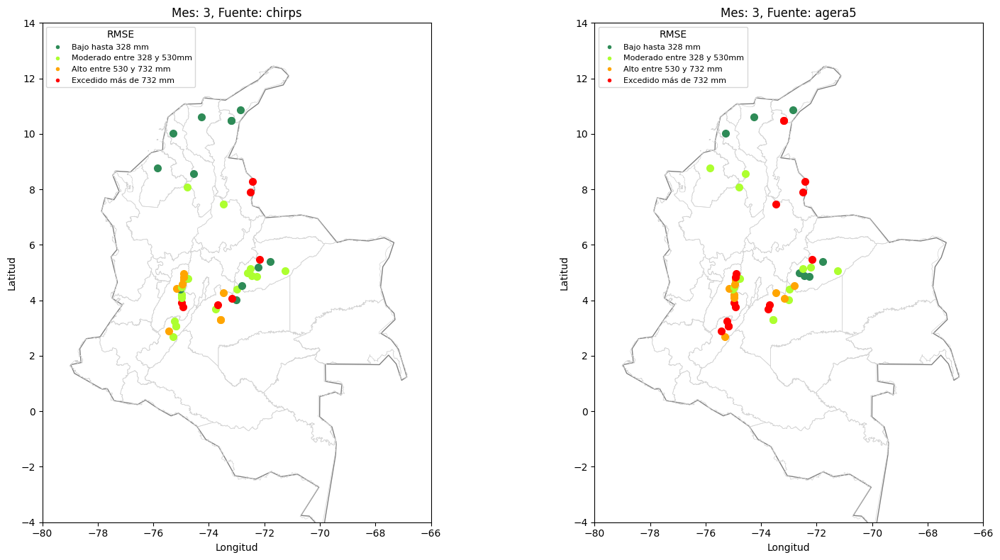

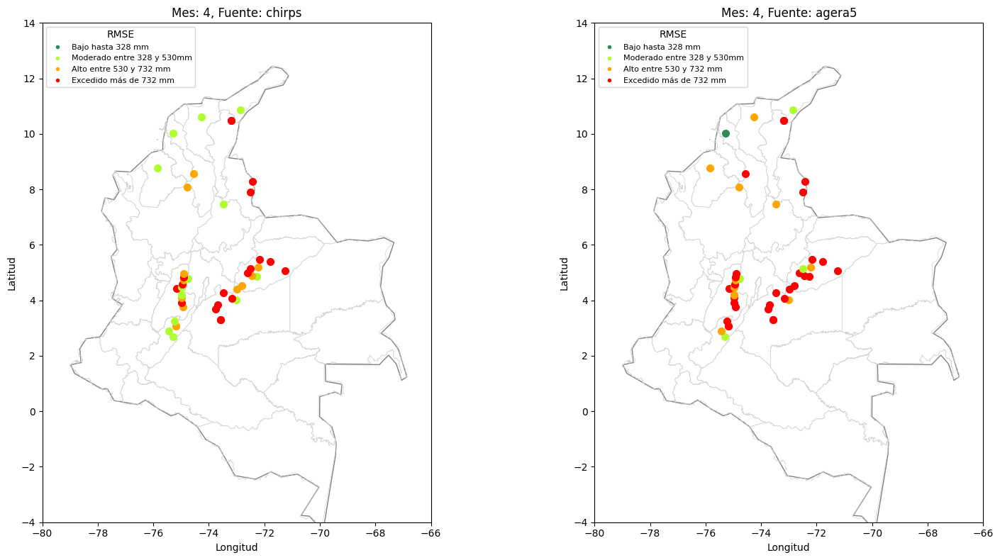

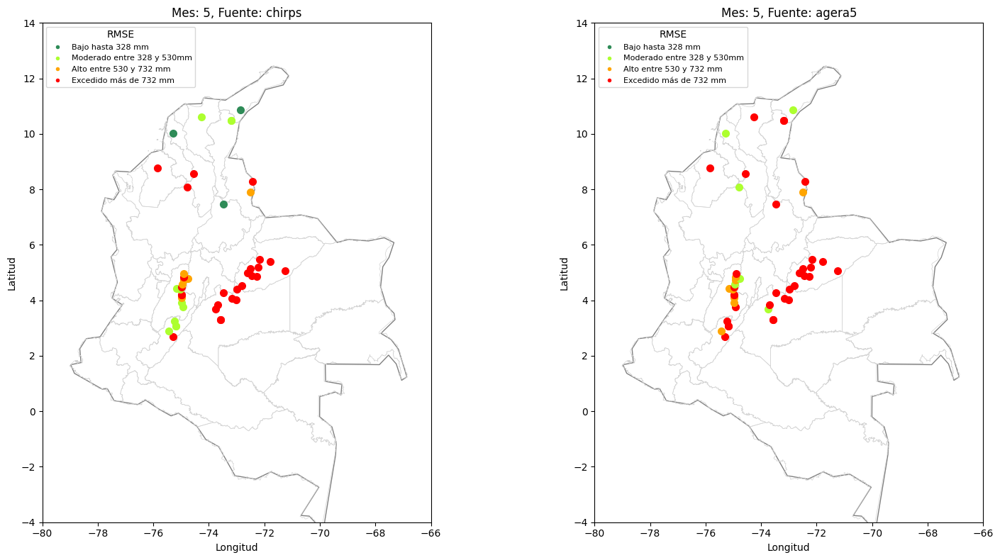

...

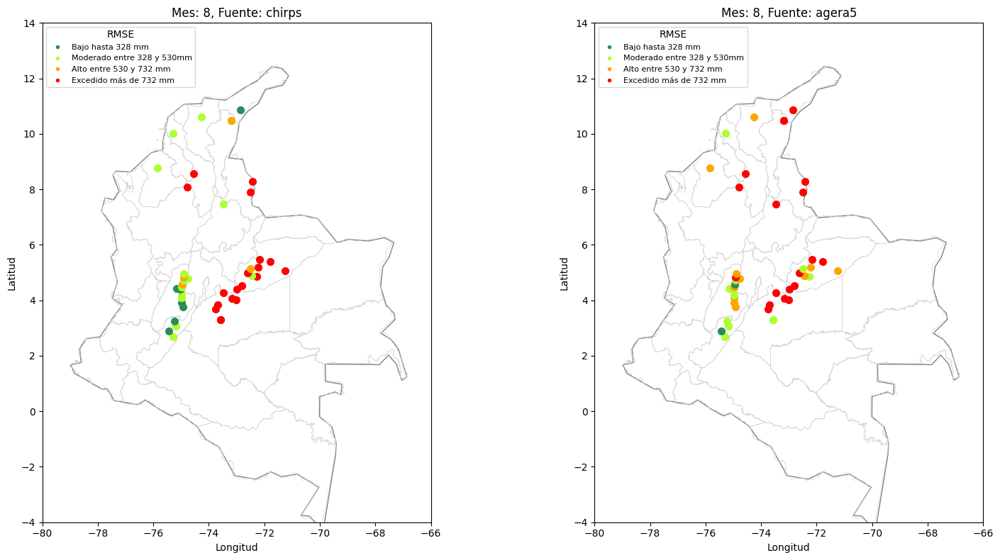

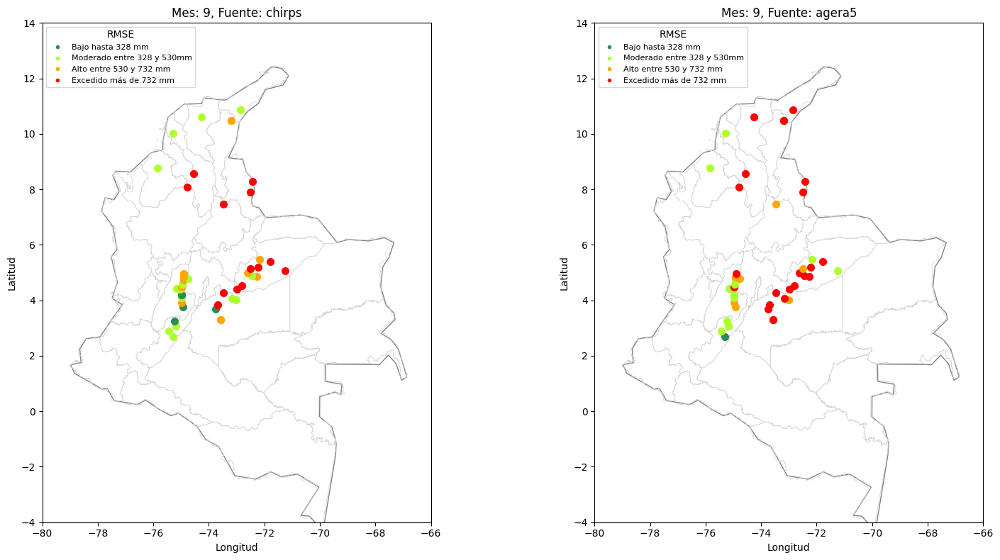

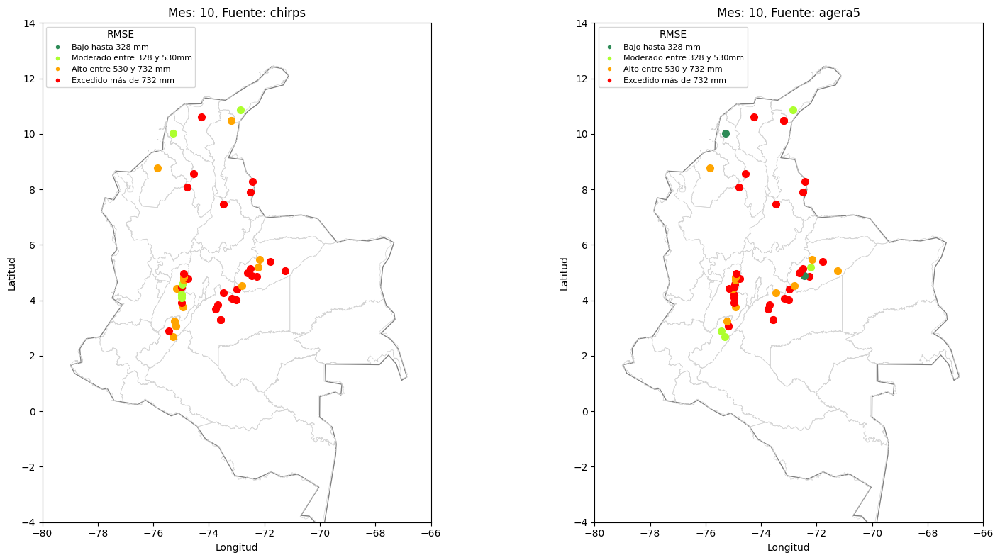

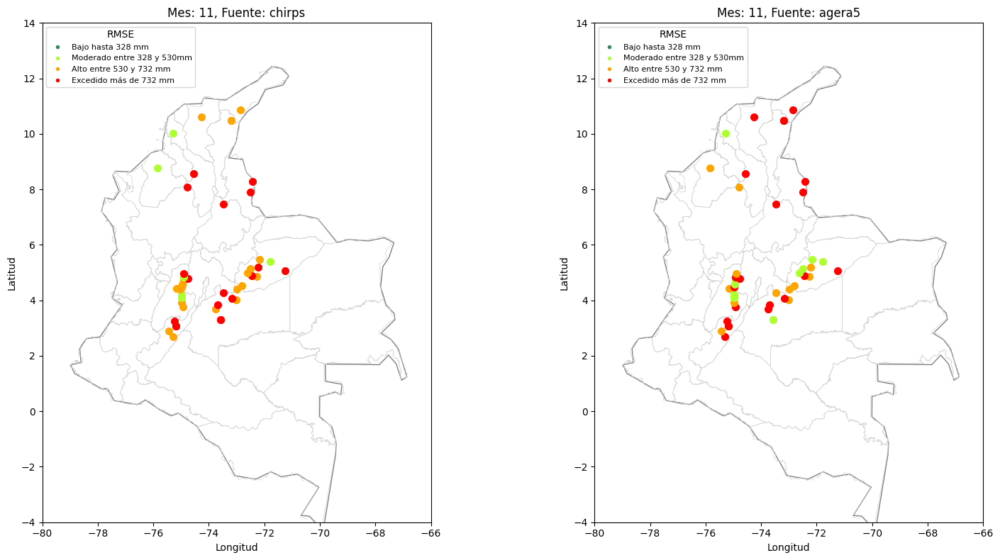

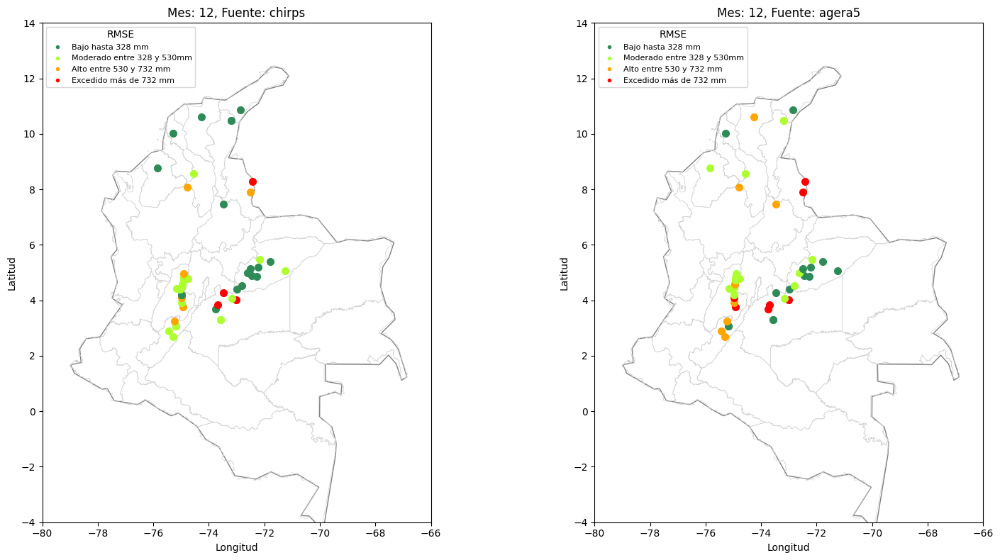

In [24]:

limites_rmse = {
    "Bajo": (0, 47),
    "Moderado": (47, 85),
    "Alto": (85, 123),
    "Excedido": (123, float("inf"))
}

def plot_rmse(df, source, month, ax):
    # Filtrar el DataFrame por source y mes
    df_filtered = df[(df['source'] == source) & (df['mes'] == month)]
    
    # Dibujar el mapa de Colombia
    colombia.plot(ax=ax, edgecolor='gray', facecolor='white')
    # Dibujar departamentos de Colombia en gris claro
    departments.plot(ax=ax, edgecolor='lightgray', facecolor='none', linewidth=0.5)

    # Definir los colores según el valor de RMSE
    def get_color(rmse):
        if limites_rmse["Bajo"][0] <= rmse < limites_rmse["Bajo"][1]:
            return '#2E8B57'  # Verde oscuro
        elif limites_rmse["Moderado"][0] <= rmse < limites_rmse["Moderado"][1]:
            return '#ADFF2F'  # Amarillo verdoso
        elif limites_rmse["Alto"][0] <= rmse < limites_rmse["Alto"][1]:
            return 'orange'
        else:
            return 'red'

    # Pintar los puntos de las estaciones con el color correspondiente
    for _, row in df_filtered.iterrows():
        ax.plot(row['longitud'], row['latitud'], marker='o', markersize=7, color=get_color(row['rmse']), label=row['station'])

    # Ajustar límites y aspecto del mapa
    ax.set_xlim([-80, -66])
    ax.set_ylim([-4, 14])
    ax.set_aspect('equal')
    
    # Leyenda de RMSE
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', label='Bajo hasta 328 mm', markerfacecolor='#2E8B57', markersize=5),
        plt.Line2D([0], [0], marker='o', color='w', label='Moderado entre 328 y 530mm', markerfacecolor='#ADFF2F', markersize=5),
        plt.Line2D([0], [0], marker='o', color='w', label='Alto entre 530 y 732 mm', markerfacecolor='orange', markersize=5),
        plt.Line2D([0], [0], marker='o', color='w', label='Excedido más de 732 mm', markerfacecolor='red', markersize=5)
    ]
    
    ax.legend(handles=legend_elements, title="RMSE", loc='upper left', fontsize=8)
    ax.set_title(f'Mes: {month}, Fuente: {source}', fontsize=12)
    ax.set_xlabel('Longitud', fontsize=10)
    ax.set_ylabel('Latitud', fontsize=10)

# Obtener lista de meses únicos
meses = df_metricas_monthly['mes'].unique()

# Crear los gráficos con una fila por cada mes y dos columnas (una para cada source)
for month in meses:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
    
    # Generar el mapa para CHIRPS
    plot_rmse(df_metricas_monthly, 'chirps', month, ax=ax1)
    
    # Generar el mapa para AGERA
    plot_rmse(df_metricas_monthly, 'agera5', month, ax=ax2)
    
    # Ajustar el espacio entre los subplots
    plt.tight_layout()
    plt.draw()  # Dibujar el gráfico
    plt.pause(0.001)  # Pausar brevemente para mostrarlo
plt.show()  # Mostrar el último gráfico al finalizar
